In [1]:
import os 
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
from tqdm import tqdm
import matplotlib 
import matplotlib.patches as patches
matplotlib.rcParams['axes.unicode_minus'] = False
plt.rcParams['font.size'] = "15"
plt.rcParams['figure.figsize'] = (16 , 5)
plt.rcParams['font.family'] = "NanumGothic"
warnings.filterwarnings('ignore')

In [2]:
TRAIN = pd.read_csv('../dataset/train_data.csv')
TEST = pd.read_csv('../dataset/test_data.csv')

train = TRAIN.copy()
test  = TEST.copy()

# 데이터 분석 단계

## **1.전체적인 데이터 파악**


## **2.target 변수 분포 파악** 

#### 3.baseline 모형을 통해 기본적인 성능 파악

4.target 변수와 독립변수들 간의 관계파악 ⇒ 파생 변수 만들기

5.모델간의 성능 비교

6.hyper parameter tuning 

7.앙상블  stacking or weight blending

---

# 참고 할 기법들

1.첨도 왜도 고려후 log 변환

2.Encoding 방법 고려 One hot encoding , Target Encoding Importance Encoding

3.차원 축소 및 군집화 고려

4.class 별 가중치나 loss 다르게주기

5.KFold나 split할때 target 변수 불균형 확인 

6.실제 ML모델이 예측을 작게하는지 크게하는지 확인 필요

7.변수들과의 관계가 높은 부문에서  group화 할 수 있는 지 확인

8.Target이 Imbalanced할 때 SMOTE나 sampling  할 수 있는 기법들 고려

9.분위수 확인 후 이상치 제거 여부 고려

10.Test set과 Train set의 분포 확인 후 overfitting 가능성 있는지 확인

11.Null값은 다른 독립변수들간의 관계 파악을 통해 설정할 수 있는지 확인

In [3]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69933 entries, 0 to 69932
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   MACHINE_NO  69933 non-null  int64  
 1   EQUIP1      69933 non-null  object 
 2   EQUIP2      69933 non-null  object 
 3   EQUIP3      69933 non-null  object 
 4   EQUIP4      69933 non-null  object 
 5   VAL1        69933 non-null  float64
 6   VAL2        69933 non-null  float64
 7   OUT         69933 non-null  float64
dtypes: float64(3), int64(1), object(4)
memory usage: 4.3+ MB


In [4]:
###결측치 확인
### 여러가지 보간 기법들이 있음 
train.isnull().sum()

MACHINE_NO    0
EQUIP1        0
EQUIP2        0
EQUIP3        0
EQUIP4        0
VAL1          0
VAL2          0
OUT           0
dtype: int64

In [5]:
train.head()

,MACHINE_NO,EQUIP1,EQUIP2,EQUIP3,EQUIP4,VAL1,VAL2,OUT
0,13,top_in_3,bot_in_24,top_out_8,bot_out_2,-4.3303,11.1340,3.172
1,13,top_in_4,bot_in_30,top_out_47,bot_out_42,-4.3359,10.4282,2.952
2,3,top_in_2,bot_in_18,top_out_39,bot_out_24,10.2006,-3.3653,-2.496
3,25,top_in_2,bot_in_23,top_out_28,bot_out_12,10.0852,-3.3595,-1.396
4,1,top_in_3,bot_in_10,top_out_2,bot_out_1,-4.3219,10.4198,2.928


In [6]:
train.columns

Index(['MACHINE_NO', 'EQUIP1', 'EQUIP2', 'EQUIP3', 'EQUIP4', 'VAL1', 'VAL2',
       'OUT'],
      dtype='object')

In [7]:
cate_columns = ['MACHINE_NO' , 'EQUIP1' , 'EQUIP2' , 'EQUIP3' , 'EQUIP4' ]
num_columns = ['VAL1' , 'VAL2']

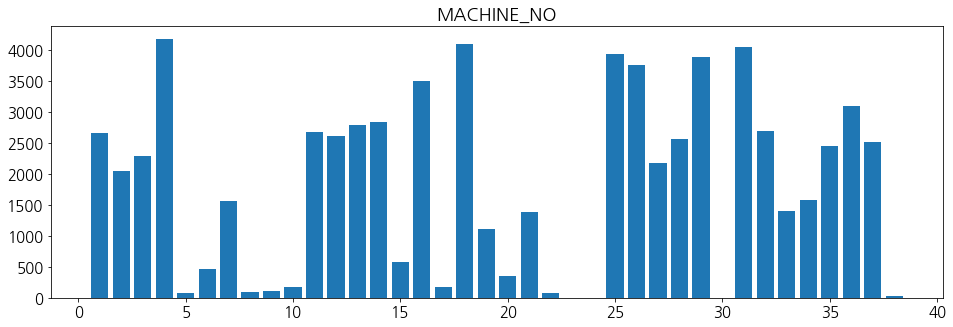

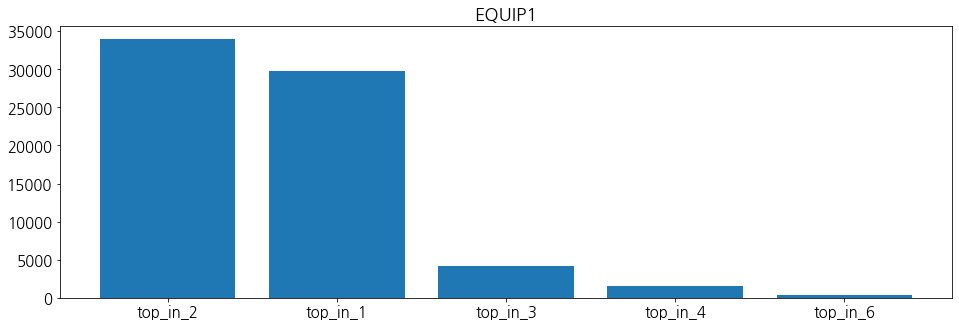

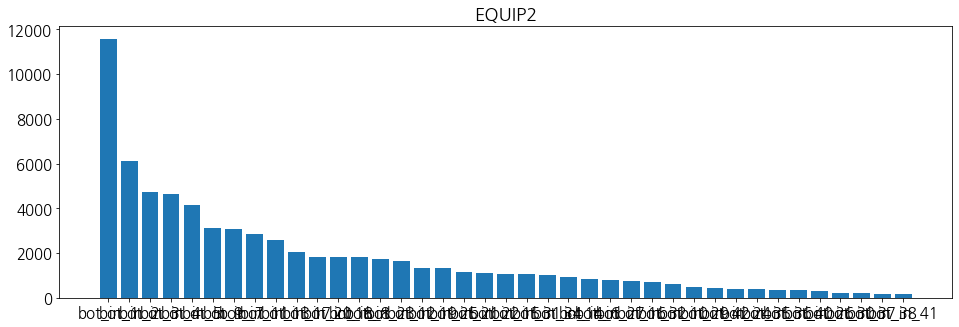

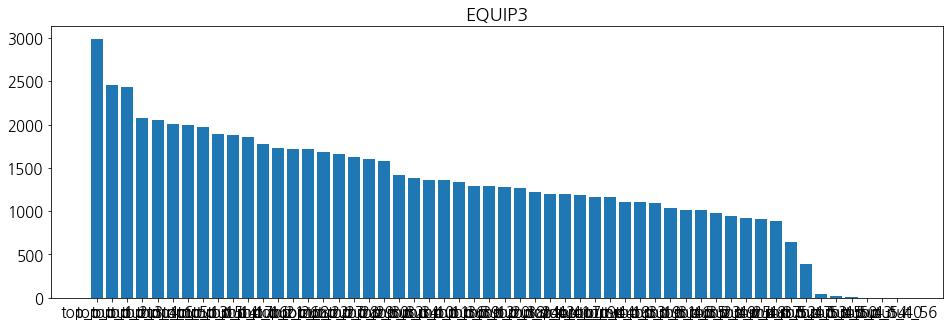

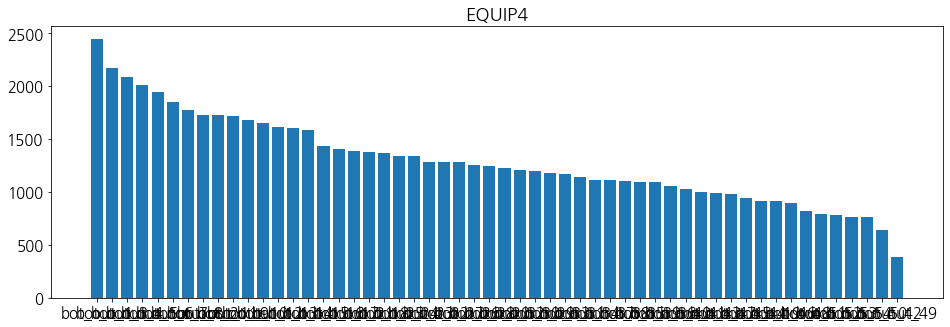

In [8]:
for cate in cate_columns:
    data = train[cate].value_counts()
    plt.title(cate)
    plt.bar(data.index ,data.values)
    plt.show()

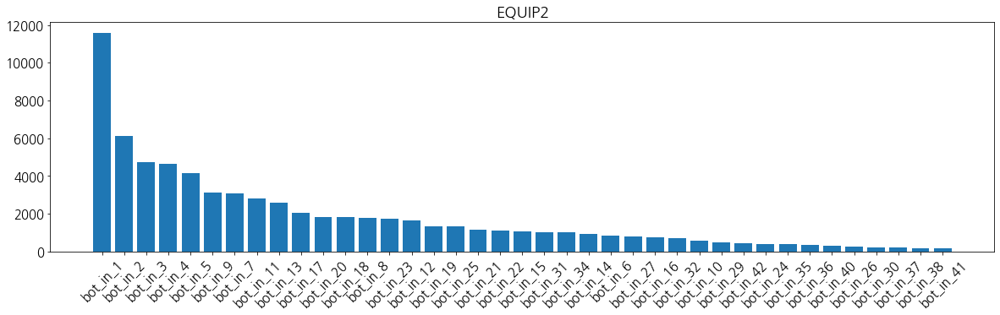

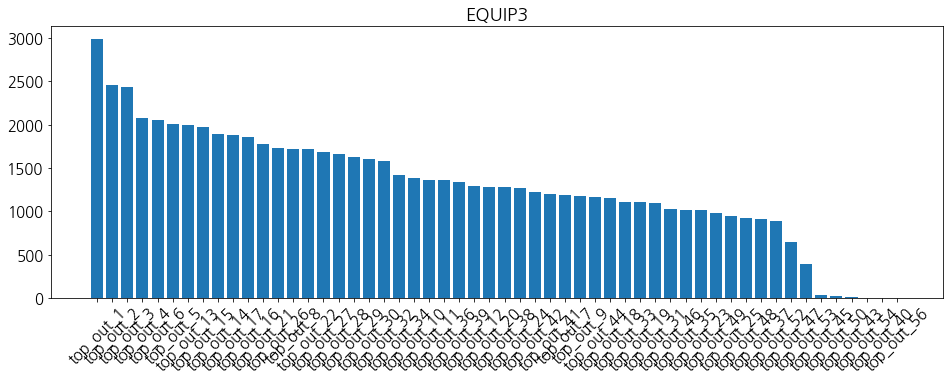

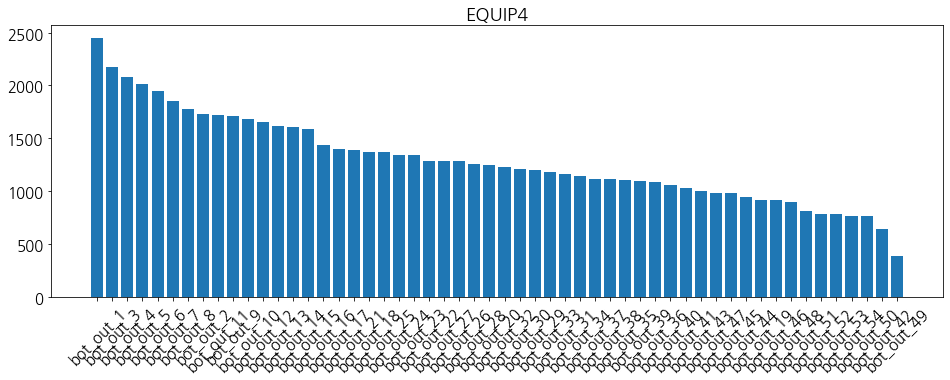

In [9]:
plt.figure(figsize = (20 ,5))
for cate in cate_columns[-3:]:
    data = train[cate].value_counts()
    plt.title(cate)
    plt.bar(data.index ,data.values)
    plt.xticks(rotation = 45)
    plt.show()

## Target 분포

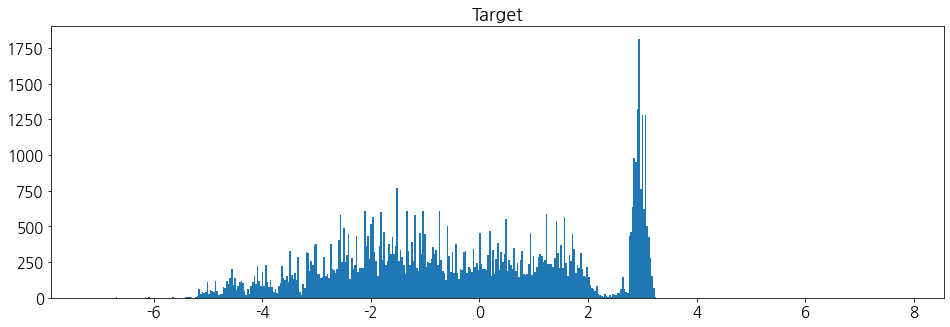

In [10]:
plt.hist(train['OUT'] , bins = 500)
plt.title('Target')
plt.show()

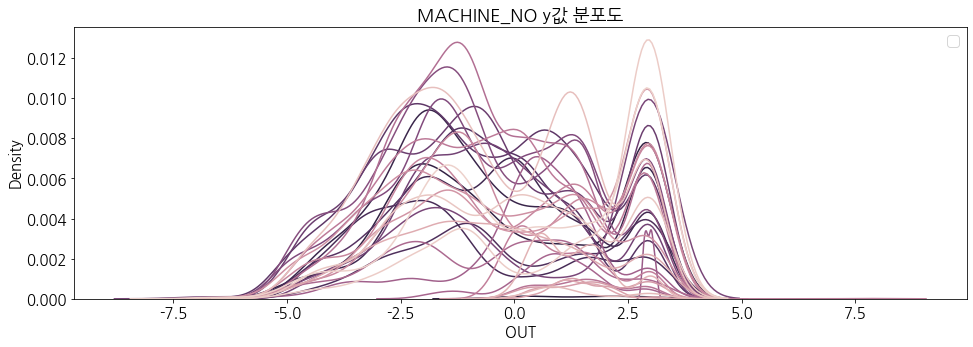

In [11]:
sns.kdeplot(x = 'OUT' , hue = 'MACHINE_NO' , data = train)
plt.title('MACHINE_NO y값 분포도')
plt.legend('')
plt.show()

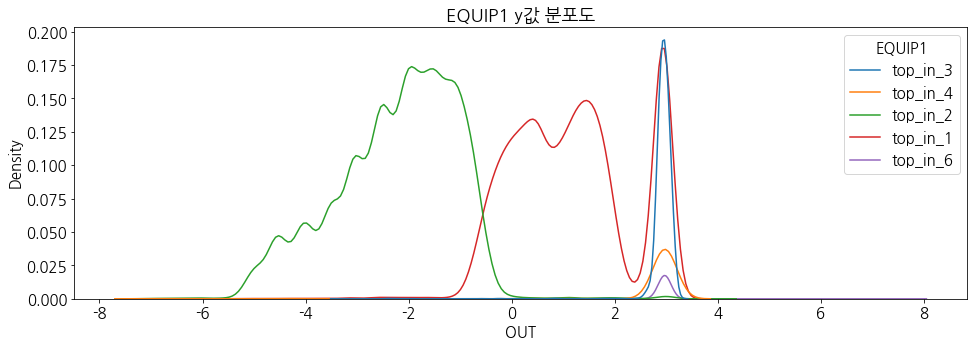

In [12]:
sns.kdeplot(x = 'OUT' , hue = 'EQUIP1' , data = train)
plt.title('EQUIP1 y값 분포도')
plt.show()

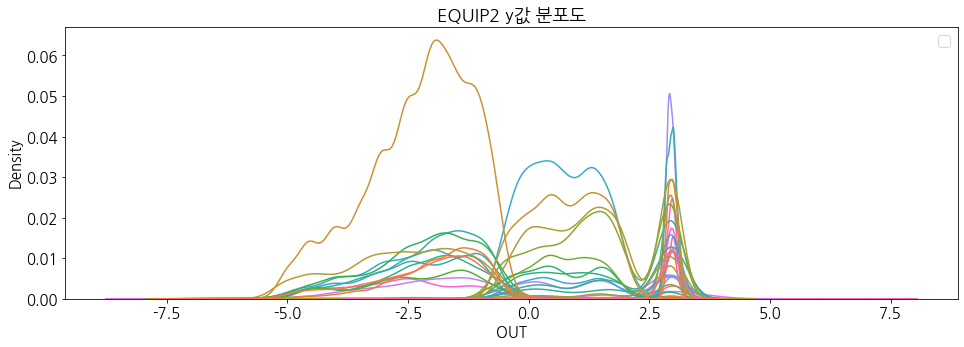

In [13]:
sns.kdeplot(x = 'OUT' , hue = 'EQUIP2' , data = train)
plt.title('EQUIP2 y값 분포도')
plt.legend('')
plt.show()

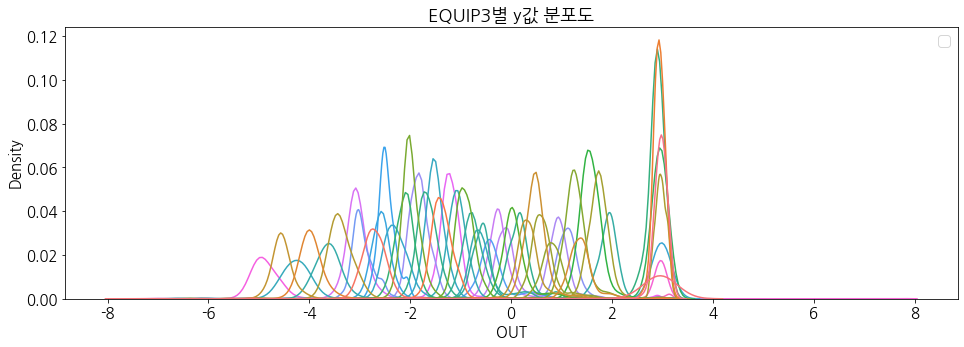

In [14]:
sns.kdeplot(x = 'OUT' , hue = 'EQUIP3' , data = train)
plt.title('EQUIP3별 y값 분포도')
plt.legend('')
plt.show()

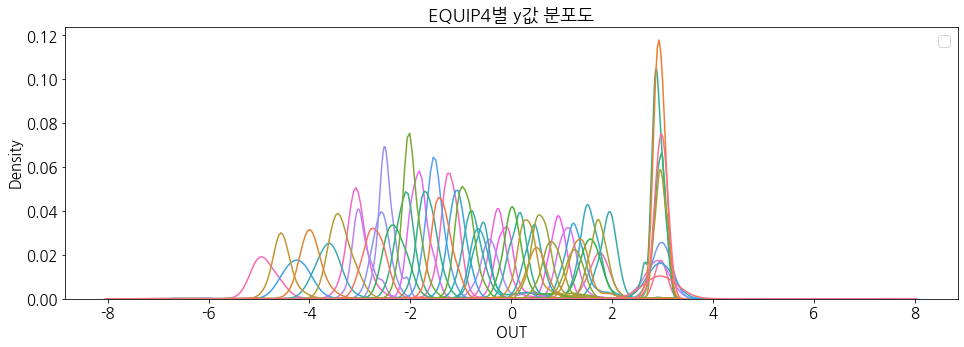

In [15]:
sns.kdeplot(x = 'OUT' , hue = 'EQUIP4' , data = train)
plt.title('EQUIP4별 y값 분포도')
plt.legend('')
plt.show()

<AxesSubplot:xlabel='OUT', ylabel='VAL2'>

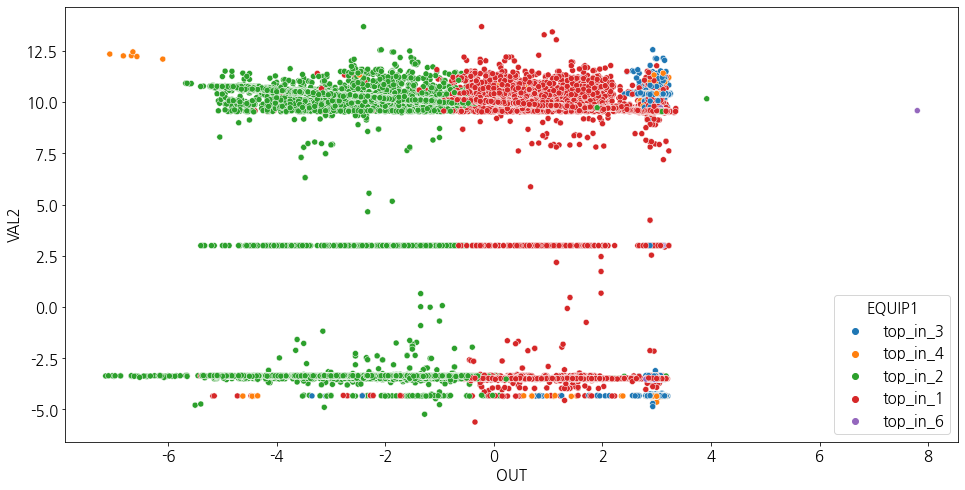

In [16]:
plt.rcParams['figure.figsize'] = (16 , 8)
sns.scatterplot(train['OUT'],train['VAL2']    , hue  = train['EQUIP1'])

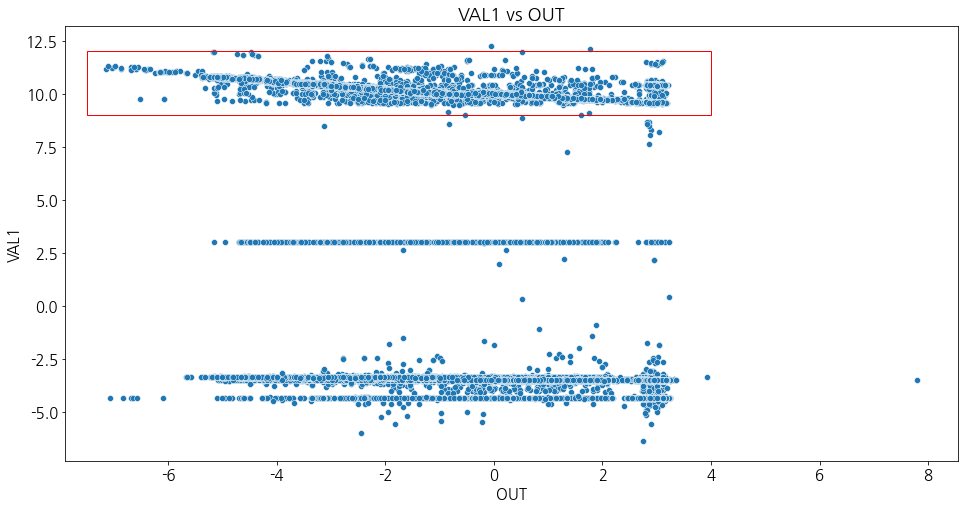

In [17]:
plt.rcParams['figure.figsize'] = (16 , 8)
fig , ax = plt.subplots( 1 , 1)

sns.scatterplot(train['OUT'],train['VAL1'] )
ax.add_patch(
   patches.Rectangle(
      (-7.5, 9),                   # (x, y)
      11.5, 3,                     # width, height
      edgecolor = 'red',
      fill=False
   ))
plt.title('VAL1 vs OUT')
plt.show()

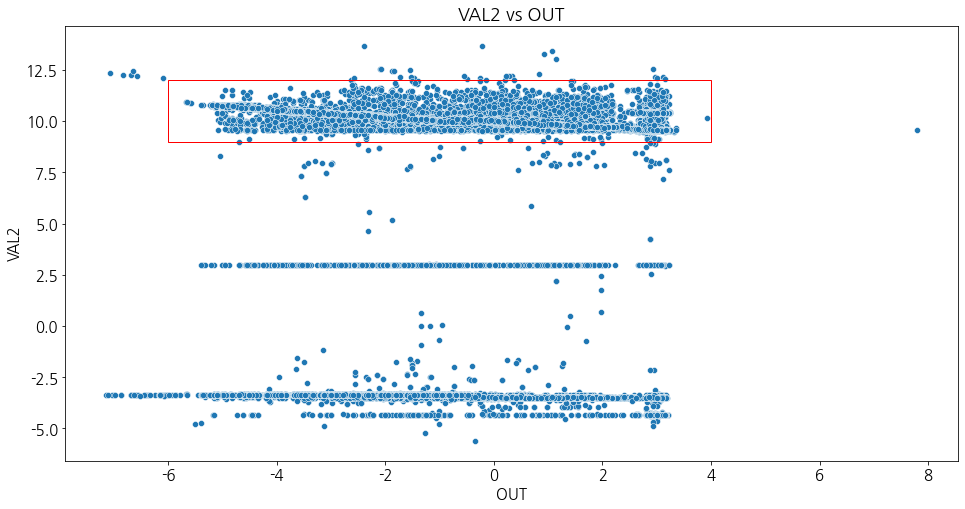

In [18]:
# plt.rcParams['figure.figsize'] = (16 , 8)
fig , ax = plt.subplots( 1 , 1)
sns.scatterplot(train['OUT'],train['VAL2'] )
ax.add_patch(
   patches.Rectangle(
      (-6, 9),                   # (x, y)
      10, 3,                     # width, height
      edgecolor = 'red',
      fill=False
   ))
plt.title('VAL2 vs OUT')
plt.show()

In [19]:
fig_plo = px.scatter_3d(train[['VAL1' , 'VAL2' , 'OUT']], x="VAL1", y="VAL2", z="OUT" )
# tight layout
fig_plo.update_traces(marker_size = 1)
fig_plo.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig_plo.show()

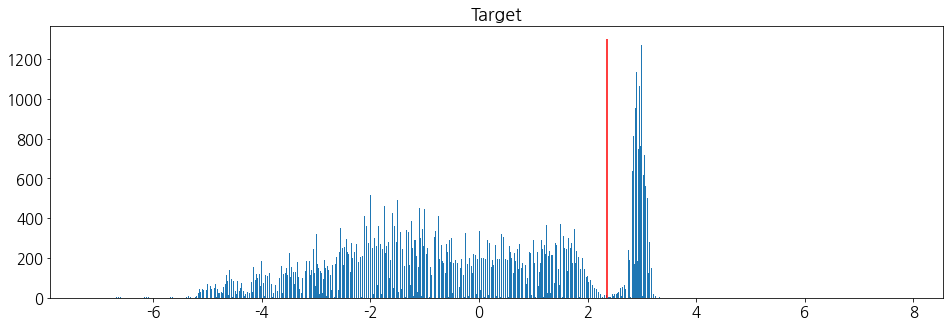

In [20]:
plt.rcParams['figure.figsize'] = (16 , 5)
plt.vlines(2.35 , 0 , 1300 , color = 'red')

plt.hist( train['OUT'], bins = 1000)
plt.title('Target')
plt.show()

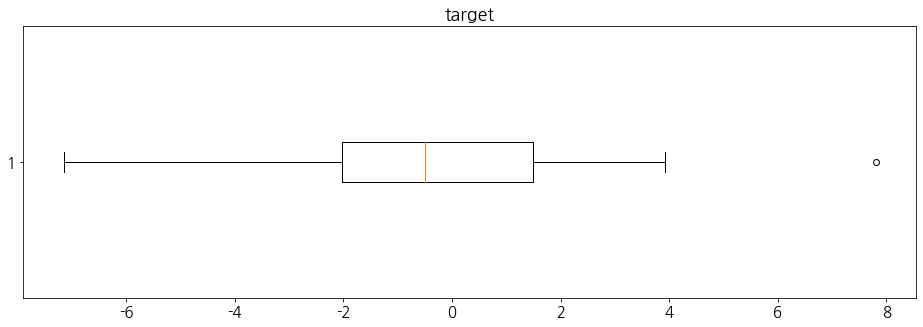

In [21]:
plt.boxplot(train['OUT'] , vert= False)
plt.title('target')
plt.show()


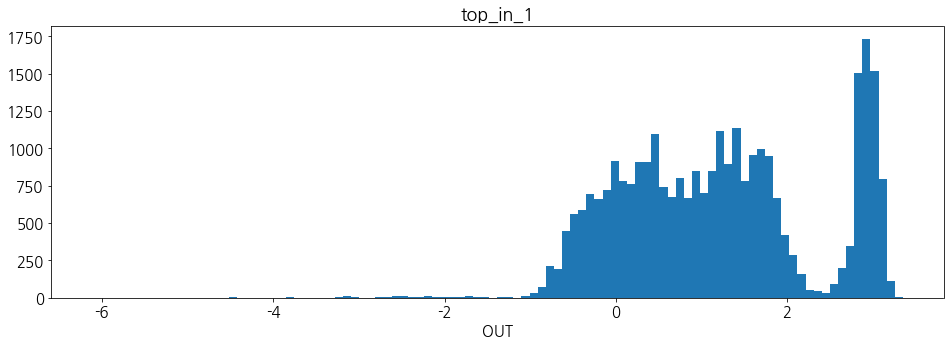

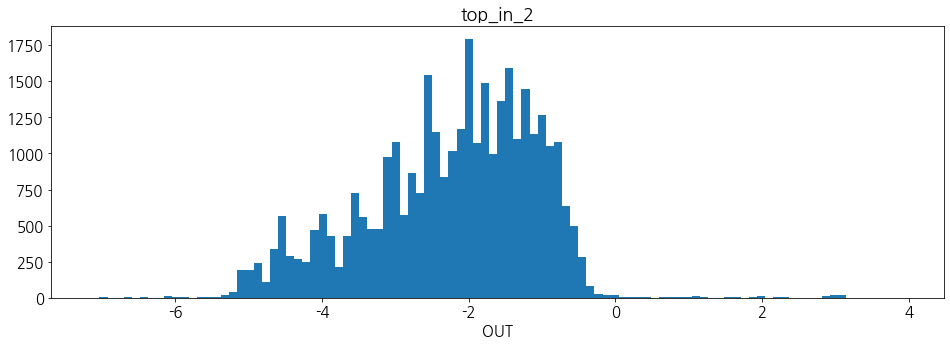

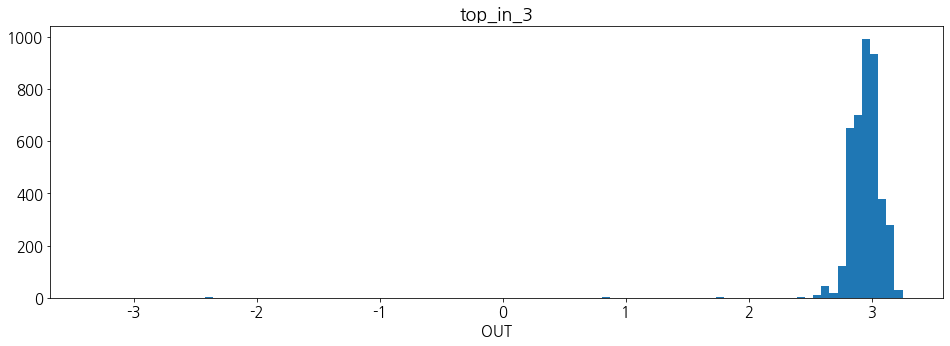

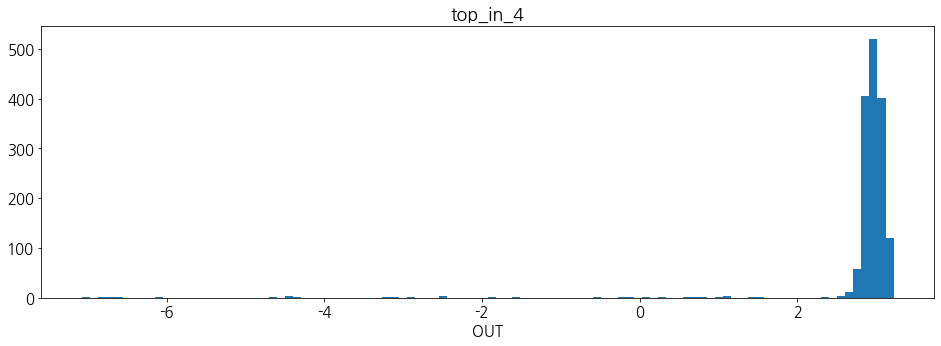

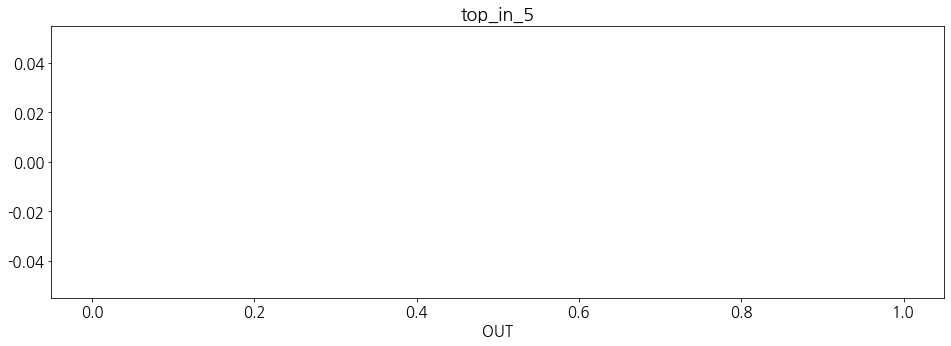

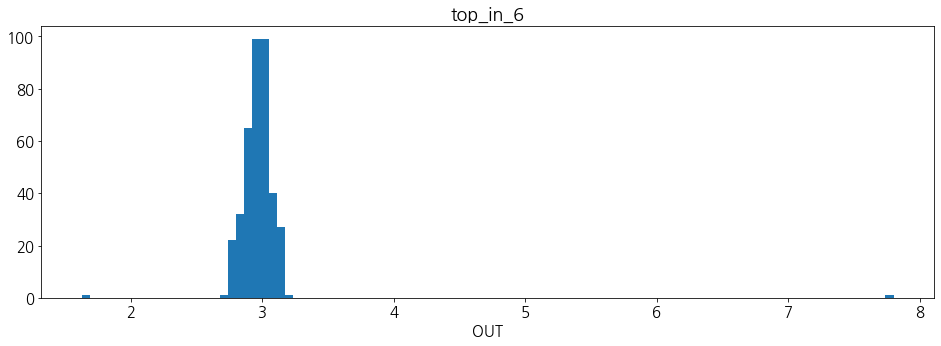

In [22]:
for i in range(1 , 7):
    data = train[train['EQUIP1'] == f'top_in_{i}']['OUT']
    plt.subplot()
    plt.title( f'top_in_{i}')
    plt.xlabel('OUT')
    
    plt.hist(data , bins = 100)
    plt.show()